# **Project Name**    - Exploratory Data Analysis of Flipkart Dataset

##### **Project Type**    - EDA
##### **Contribution**    - Individual
##### **Name              -** K. Abhinay


# **Project Summary -**

* **Objective:** Enhance customer satisfaction by analyzing Flipkart's customer support data.

* **Data Preprocessing:** Handled missing values, removed irrelevant columns, and engineered 'response_time' feature.

* **Order Trends:**

    * Significant order growth from 2022 to 2023.

    * August is the peak month for orders.

    * Tuesdays have the highest order volume.

* **Category-Specific Issues:**

    * Electronics: Returns, order-related issues prevalent.

    * Lifestyle: Refunds and returns dominate.

    * Mobiles : General Enquiry, Online Payment Issues are dominant.

    * Channel Performance: Email has the longest average response time; inbound/outcall are more efficient.

    * Regional Analysis: Hyderabad has the highest order volume.

* **Agent Performance:**

    * Inconsistent CSAT scores.

    * Significant variations in response times.

    * Tenure doesn't significantly impact CSAT, but impacts response time

* **Correlation Analysis:** Product category and item price show a positive correlation.

* **Key Recommendations:**

    * Optimize email response times through automation.

    * Staff up during peak times (August, Tuesdays).

    * Address product-specific issues for electronics, lifestyle, and mobile categories.

    * Provide targeted training to underperforming agents.

    * Focus on improving response times for "Product Queries", "Payment related" and "Platform related" categories.

    * Tailor marketing to high-performing cities like Hyderabad.

**Overall Goal:** Improve customer satisfaction, optimize support, drive business growth, and enhance Flipkart's brand reputation.

# **Problem Statement**


**The project aims to analyze customer interactions, feedback, and satisfaction scores across Flipkart's customer support channels to identify key drivers of customer satisfaction. The goal is to understand service performance across teams and develop strategies to enhance the overall customer service experience.**

#### **Define Your Business Objective?**

The primary objective is to improve customer satisfaction by identifying patterns in support interactions, optimizing agent performance, and reducing response times. This analysis will help Flipkart refine its customer service strategies, improve CSAT scores, and enhance brand loyalty and customer retention.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder

from pandas.errors import SettingWithCopyWarning
import warnings
warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)

### Dataset Loading

In [2]:
# Load Dataset
df=pd.read_csv('Customer_support_data.csv')

### Dataset First View

In [3]:
# Dataset First Look
df.head()

,Unique id,channel_name,category,Sub-category,Customer Remarks,Order_id,order_date_time,Issue_reported at,issue_responded,Survey_response_Date,Customer_City,Product_category,Item_price,connected_handling_time,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,7e9ae164-6a8b-4521-a2d4-58f7c9fff13f,Outcall,Product Queries,Life Insurance,NaN,c27c9bb4-fa36-4140-9f1f-21009254ffdb,NaN,01/08/2023 11:13,01/08/2023 11:47,01-Aug-23,NaN,NaN,NaN,NaN,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5
1,b07ec1b0-f376-43b6-86df-ec03da3b2e16,Outcall,Product Queries,Product Specific Information,NaN,d406b0c7-ce17-4654-b9de-f08d421254bd,NaN,01/08/2023 12:52,01/08/2023 12:54,01-Aug-23,NaN,NaN,NaN,NaN,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5
2,200814dd-27c7-4149-ba2b-bd3af3092880,Inbound,Order Related,Installation/demo,NaN,c273368d-b961-44cb-beaf-62d6fd6c00d5,NaN,01/08/2023 20:16,01/08/2023 20:38,01-Aug-23,NaN,NaN,NaN,NaN,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5
3,eb0d3e53-c1ca-42d3-8486-e42c8d622135,Inbound,Returns,Reverse Pickup Enquiry,NaN,5aed0059-55a4-4ec6-bb54-97942092020a,NaN,01/08/2023 20:56,01/08/2023 21:16,01-Aug-23,NaN,NaN,NaN,NaN,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5
4,ba903143-1e54-406c-b969-46c52f92e5df,Inbound,Cancellation,Not Needed,NaN,e8bed5a9-6933-4aff-9dc6-ccefd7dcde59,NaN,01/08/2023 10:30,01/08/2023 10:32,01-Aug-23,NaN,NaN,NaN,NaN,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5


### Dataset Rows & Columns count

In [4]:
# Dataset Rows & Columns count
original=df.shape[0]
df.shape

(85907, 20)

### Dataset Information

In [5]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85907 entries, 0 to 85906
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unique id                85907 non-null  object 
 1   channel_name             85907 non-null  object 
 2   category                 85907 non-null  object 
 3   Sub-category             85907 non-null  object 
 4   Customer Remarks         28742 non-null  object 
 5   Order_id                 67675 non-null  object 
 6   order_date_time          17214 non-null  object 
 7   Issue_reported at        85907 non-null  object 
 8   issue_responded          85907 non-null  object 
 9   Survey_response_Date     85907 non-null  object 
 10  Customer_City            17079 non-null  object 
 11  Product_category         17196 non-null  object 
 12  Item_price               17206 non-null  float64
 13  connected_handling_time  242 non-null    float64
 14  Agent_name            

#### Duplicate Values

In [6]:
# Dataset Duplicate Value Count
print("No of Duplicated Values :",df.duplicated().sum())

No of Duplicated Values : 0


#### Missing Values/Null Values

In [7]:
# Missing Values/Null Values Count
print("Missing Values")
print(df.isnull().sum())

Missing Values
Unique id                      0
channel_name                   0
category                       0
Sub-category                   0
Customer Remarks           57165
Order_id                   18232
order_date_time            68693
Issue_reported at              0
issue_responded                0
Survey_response_Date           0
Customer_City              68828
Product_category           68711
Item_price                 68701
connected_handling_time    85665
Agent_name                     0
Supervisor                     0
Manager                        0
Tenure Bucket                  0
Agent Shift                    0
CSAT Score                     0
dtype: int64


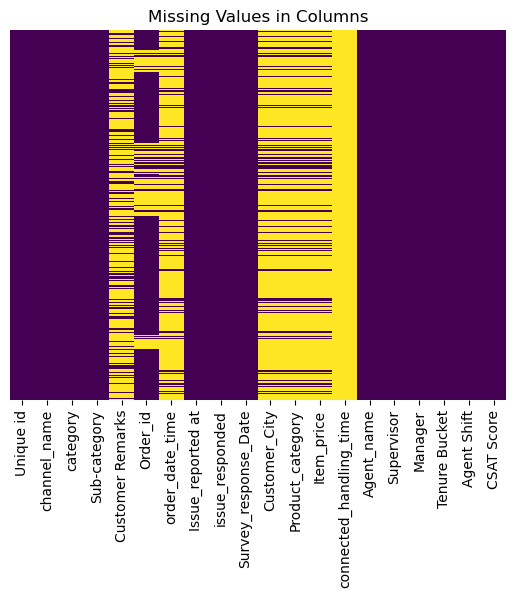

In [8]:
# Visualizing the missing values
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
plt.title("Missing Values in Columns")
plt.show()

### What did you know about your dataset?

The size of the dataset is 85,907 rows and 20 columns. The Column description is as follows:
* **Unique id :** Unique identifier for each record
* **Channel Name :** Name of the customer service channel
* **Category :** Category of the interaction
* **Sub-Category :** Sub-category of the interaction
* **Customer Remarks :** Feedback provided by the customer
* **Order id :** Identifier for the order associated with the interaction
* **Order date time :** Date and time of the order
* **Issue reported at :** Timestamp when the issue was reported
* **Issue responded :** Timestamp when the issue was responded to
* **Survey response date :** Date of the customer survey response
* **Customer City :** City of the customer
* **Product category :** Category of the product
* **Item Price :** Price of the item
* **Connected handling time :** Time taken to handle the interaction
* **Agent name :** Name of the customer service agent
* **Supervisor :** Name of the supervisor
* **Manager :** Name of the manager
* **Tenure Bucket :** Bucket categorizing agent tenure
* **Agent Shift :** Shift timing of the agent
* **CSAT Score :** Customer Satisfaction (CSAT) score

In which the "Customer_Remarks", "Order_id", "order_date_time", "Customer_city", "Product_category", "Item_Price", "Connected_handling_time"  columns have null values in them and No duplicate values were found.


## ***2. Understanding Your Variables***

In [9]:
# Dataset Columns
df.columns

Index(['Unique id', 'channel_name', 'category', 'Sub-category',
       'Customer Remarks', 'Order_id', 'order_date_time', 'Issue_reported at',
       'issue_responded', 'Survey_response_Date', 'Customer_City',
       'Product_category', 'Item_price', 'connected_handling_time',
       'Agent_name', 'Supervisor', 'Manager', 'Tenure Bucket', 'Agent Shift',
       'CSAT Score'],
      dtype='object')

In [10]:
# Dataset Describe
df.describe()

,Item_price,connected_handling_time,CSAT Score
count,17206.000000,242.000000,85907.000000
mean,5660.774846,462.400826,4.242157
std,12825.728411,246.295037,1.378903
min,0.000000,0.000000,1.000000
25%,392.000000,293.000000,4.000000
50%,979.000000,427.000000,5.000000
75%,2699.750000,592.250000,5.000000
max,164999.000000,1986.000000,5.000000


### Check Unique Values for each variable.

In [11]:
# Check Unique Values for each variable.
print("Number of Unique Values in dataset")
for x in df.columns:
    print(x,":",df[x].nunique())

Number of Unique Values in dataset
Unique id : 85907
channel_name : 3
category : 12
Sub-category : 57
Customer Remarks : 18231
Order_id : 67675
order_date_time : 13766
Issue_reported at : 30923
issue_responded : 30262
Survey_response_Date : 31
Customer_City : 1782
Product_category : 9
Item_price : 2789
connected_handling_time : 211
Agent_name : 1371
Supervisor : 40
Manager : 6
Tenure Bucket : 5
Agent Shift : 5
CSAT Score : 5


In [12]:
print("Unique Values in dataset")
for x in df.columns:
    print(x,":",df[x].unique())

Unique Values in dataset
Unique id : ['7e9ae164-6a8b-4521-a2d4-58f7c9fff13f'
 'b07ec1b0-f376-43b6-86df-ec03da3b2e16'
 '200814dd-27c7-4149-ba2b-bd3af3092880' ...
 '723bce2c-496c-4aa8-a64b-ca17004528f0'
 '707528ee-6873-4192-bfa9-a491f1c08ab5'
 '07c7a878-0d5a-42e0-97ef-de59abec0238']
channel_name : ['Outcall' 'Inbound' 'Email']
category : ['Product Queries' 'Order Related' 'Returns' 'Cancellation'
 'Shopzilla Related' 'Payments related' 'Refund Related' 'Feedback'
 'Offers & Cashback' 'Onboarding related' 'Others' 'App/website']
Sub-category : ['Life Insurance' 'Product Specific Information' 'Installation/demo'
 'Reverse Pickup Enquiry' 'Not Needed' 'Fraudulent User'
 'Exchange / Replacement' 'Missing' 'General Enquiry' 'Return request'
 'Delayed' 'Service Centres Related' 'Payment related Queries'
 'Order status enquiry' 'Return cancellation' 'Unable to track'
 'Seller Cancelled Order' 'Wrong' 'Invoice request' 'Priority delivery'
 'Refund Related Issues' 'Signup Issues' 'Online Payment 

## 3. ***Data Wrangling***

### Data Wrangling Code

In [13]:
# Code to make your dataset analysis ready.
df.head()

,Unique id,channel_name,category,Sub-category,Customer Remarks,Order_id,order_date_time,Issue_reported at,issue_responded,Survey_response_Date,Customer_City,Product_category,Item_price,connected_handling_time,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,7e9ae164-6a8b-4521-a2d4-58f7c9fff13f,Outcall,Product Queries,Life Insurance,NaN,c27c9bb4-fa36-4140-9f1f-21009254ffdb,NaN,01/08/2023 11:13,01/08/2023 11:47,01-Aug-23,NaN,NaN,NaN,NaN,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5
1,b07ec1b0-f376-43b6-86df-ec03da3b2e16,Outcall,Product Queries,Product Specific Information,NaN,d406b0c7-ce17-4654-b9de-f08d421254bd,NaN,01/08/2023 12:52,01/08/2023 12:54,01-Aug-23,NaN,NaN,NaN,NaN,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5
2,200814dd-27c7-4149-ba2b-bd3af3092880,Inbound,Order Related,Installation/demo,NaN,c273368d-b961-44cb-beaf-62d6fd6c00d5,NaN,01/08/2023 20:16,01/08/2023 20:38,01-Aug-23,NaN,NaN,NaN,NaN,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5
3,eb0d3e53-c1ca-42d3-8486-e42c8d622135,Inbound,Returns,Reverse Pickup Enquiry,NaN,5aed0059-55a4-4ec6-bb54-97942092020a,NaN,01/08/2023 20:56,01/08/2023 21:16,01-Aug-23,NaN,NaN,NaN,NaN,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5
4,ba903143-1e54-406c-b969-46c52f92e5df,Inbound,Cancellation,Not Needed,NaN,e8bed5a9-6933-4aff-9dc6-ccefd7dcde59,NaN,01/08/2023 10:30,01/08/2023 10:32,01-Aug-23,NaN,NaN,NaN,NaN,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5


In [14]:
df.drop(["Unique id","Customer Remarks","Order_id","Survey_response_Date"],axis=1,inplace=True) # Dropping unnecessary columns for analysis
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,connected_handling_time,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,Outcall,Product Queries,Life Insurance,NaN,01/08/2023 11:13,01/08/2023 11:47,NaN,NaN,NaN,NaN,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5
1,Outcall,Product Queries,Product Specific Information,NaN,01/08/2023 12:52,01/08/2023 12:54,NaN,NaN,NaN,NaN,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5
2,Inbound,Order Related,Installation/demo,NaN,01/08/2023 20:16,01/08/2023 20:38,NaN,NaN,NaN,NaN,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5
3,Inbound,Returns,Reverse Pickup Enquiry,NaN,01/08/2023 20:56,01/08/2023 21:16,NaN,NaN,NaN,NaN,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5
4,Inbound,Cancellation,Not Needed,NaN,01/08/2023 10:30,01/08/2023 10:32,NaN,NaN,NaN,NaN,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5


In [15]:
def null_vis(df):   # function to visualize null value counts in columns of a dataframe
    fp_df=df.isna().sum().to_frame()
    fp_df.reset_index(inplace=True)
    fp_df.rename({'index':'col',0:"count"},axis='columns',inplace=True)
    fp_df=fp_df[fp_df['count']!=0]
    fp_df=fp_df.sort_values("count",ascending=False)

    plt.figure(figsize=(12,5))
    sns.barplot(x=fp_df['col'],y=fp_df['count'],palette='husl',hue=fp_df['col'])
    for i, value in enumerate(fp_df["count"]):
        plt.annotate(str(value), xy=(i, value), ha='center', va='bottom')
    plt.title("No of Null Values")
    plt.xlabel('Columns')
    plt.ylabel("Count")
    plt.show()

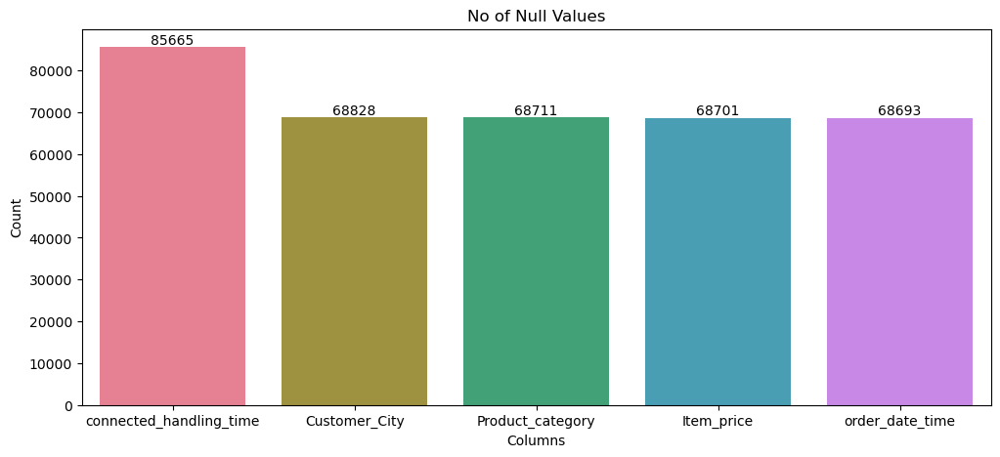

In [16]:
null_vis(df)

In [17]:
(df.isna().sum()/len(df)*100).sort_values(ascending=False)  # get percentage of null values in the columns

connected_handling_time    99.718300
Customer_City              80.119199
Product_category           79.983005
Item_price                 79.971364
order_date_time            79.962052
channel_name                0.000000
category                    0.000000
Sub-category                0.000000
Issue_reported at           0.000000
issue_responded             0.000000
Agent_name                  0.000000
Supervisor                  0.000000
Manager                     0.000000
Tenure Bucket               0.000000
Agent Shift                 0.000000
CSAT Score                  0.000000
dtype: float64

In [18]:
df.drop("connected_handling_time",axis=1,inplace=True) # Most of the values are null so dropping the column

In [19]:
df['Customer_City']=df['Customer_City'].fillna("Unknown") # Filling the null values with Unknown

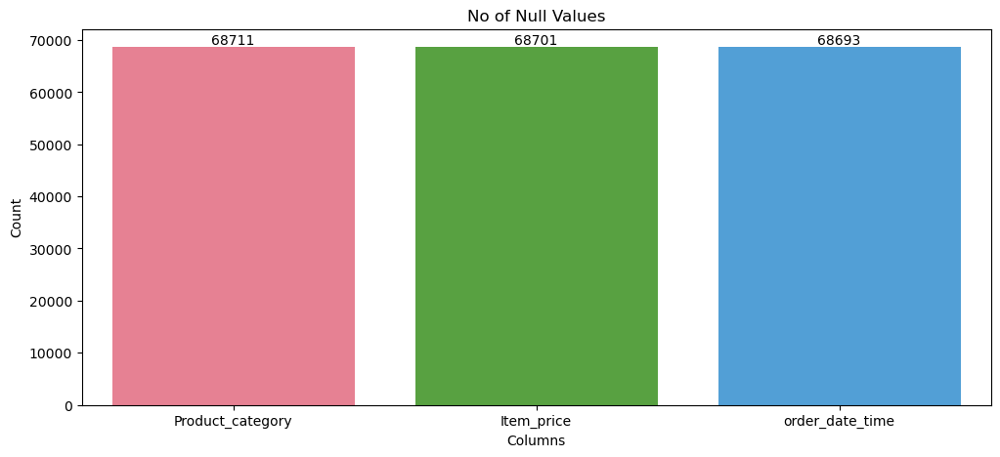

In [20]:
null_vis(df)

In [21]:
df['Product_category'].value_counts()

Product_category
Electronics                    4706
LifeStyle                      4118
Books & General merchandise    3323
Mobile                         1758
Home                           1328
Home Appliences                1300
Furniture                       471
Affiliates                      166
GiftCard                         26
Name: count, dtype: int64

In [22]:
df[df['Product_category'].isna()]['category'].value_counts() # Finding number of categories having product_category as null value

category
Returns               35857
Order Related         16936
Product Queries        3675
Refund Related         3382
Shopzilla Related      2772
Payments related       2278
Feedback               1758
Cancellation           1411
Offers & Cashback       421
App/website              84
Others                   72
Onboarding related       65
Name: count, dtype: int64

In [23]:
df[df['Product_category'].isna()]['Sub-category'].value_counts() # Finding number of sub-categories having product_category as null value

Sub-category
Reverse Pickup Enquiry              18521
Return request                       6801
Order status enquiry                 5393
Delayed                              3716
Installation/demo                    3637
Product Specific Information         3584
Fraudulent User                      3310
Missing                              2155
Refund Enquiry                       2067
Wrong                                2006
General Enquiry                      1895
UnProfessional Behaviour             1758
Service Centres Related              1425
Invoice request                      1347
Refund Related Issues                1238
Not Needed                           1155
Online Payment Issues                1077
Seller Cancelled Order                981
Priority delivery                     759
Payment related Queries               714
Exchange / Replacement                709
Customer Requested Modifications      701
Signup Issues                         489
Damaged              

In [24]:
# filling the null values in product category with most repeated values with respect to each category
df["Product_category"]=df.groupby('category')['Product_category'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else "Unknown"))

In [25]:
# filling the null values in item price with median values with respect to product category since mean is sensitive for large values
df['Item_price']=df.groupby("Product_category")['Item_price'].transform(lambda x: x.fillna(x.median()))

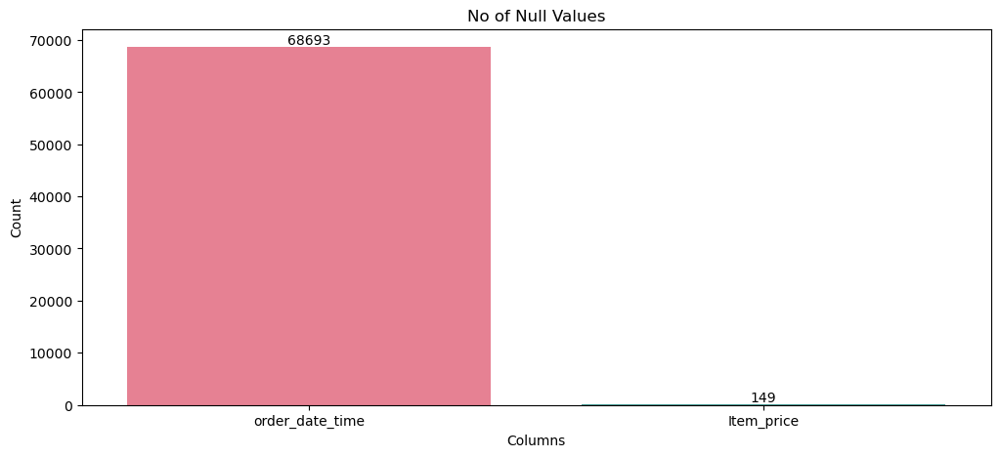

In [26]:
null_vis(df)

In [27]:
df[df["order_date_time"].isna()]["category"].value_counts()

category
Returns               35855
Order Related         16931
Product Queries        3675
Refund Related         3378
Shopzilla Related      2772
Payments related       2278
Feedback               1756
Cancellation           1410
Offers & Cashback       417
App/website              84
Others                   72
Onboarding related       65
Name: count, dtype: int64

In [28]:
df[df['order_date_time'].isna()]['Sub-category'].value_counts()

Sub-category
Reverse Pickup Enquiry              18519
Return request                       6801
Order status enquiry                 5392
Delayed                              3713
Installation/demo                    3637
Product Specific Information         3584
Fraudulent User                      3310
Missing                              2155
Refund Enquiry                       2067
Wrong                                2006
General Enquiry                      1895
UnProfessional Behaviour             1756
Service Centres Related              1425
Invoice request                      1346
Refund Related Issues                1234
Not Needed                           1154
Online Payment Issues                1077
Seller Cancelled Order                981
Priority delivery                     759
Payment related Queries               714
Exchange / Replacement                709
Customer Requested Modifications      701
Signup Issues                         489
Damaged              

In [29]:
# filling order_date_time columns null values with mode of each sub-category
df['order_date_time']=df.groupby('Sub-category')['order_date_time'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else "Unknown"))

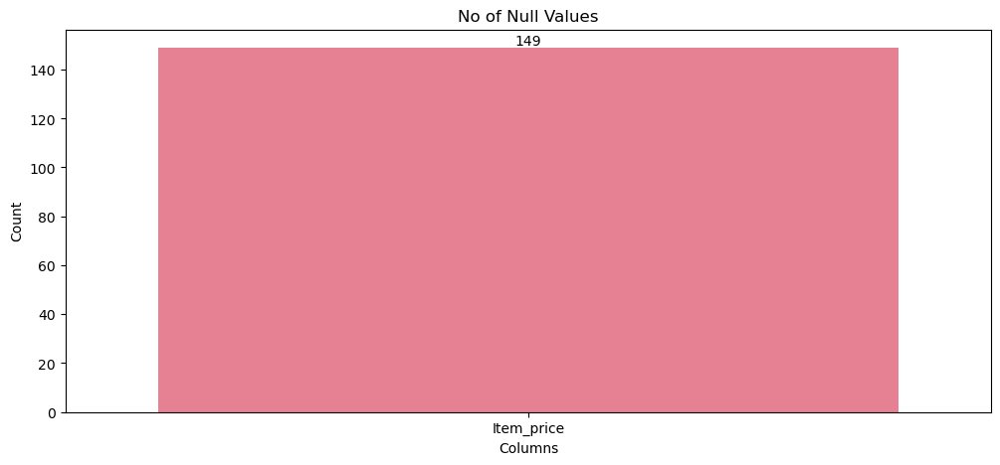

In [30]:
null_vis(df)

In [31]:
df[df["Item_price"].isna()]

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
375,Outcall,Onboarding related,Seller onboarding,Unknown,01/08/2023 14:50,01/08/2023 14:52,Unknown,Unknown,NaN,Kathleen Williams,Mason Gupta,Olivia Tan,>90,Morning,5
1050,Inbound,Onboarding related,Seller onboarding,Unknown,01/08/2023 19:09,01/08/2023 19:57,Unknown,Unknown,NaN,Jennifer Lewis,Madison Kim,John Smith,>90,Morning,5
1429,Inbound,App/website,App/website Related,Unknown,02/08/2023 22:14,02/08/2023 23:16,Unknown,Unknown,NaN,Regina Harper,Harper Wong,William Kim,On Job Training,Evening,5
1515,Inbound,App/website,Issues with Shopzilla App,Unknown,01/08/2023 17:20,01/08/2023 18:13,Unknown,Unknown,NaN,Lorraine Smith,Carter Park,Jennifer Nguyen,On Job Training,Evening,5
1626,Inbound,App/website,App/website Related,Unknown,01/08/2023 16:00,01/08/2023 16:35,Unknown,Unknown,NaN,Matthew White PhD,Scarlett Chen,John Smith,0-30,Morning,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82860,Outcall,Onboarding related,Commission related,Unknown,30/08/2023 17:00,30/08/2023 17:03,Unknown,Unknown,NaN,Carla Morgan,Nathan Patel,Emily Chen,0-30,Evening,5
83315,Outcall,Onboarding related,Seller onboarding,Unknown,30/08/2023 16:35,30/08/2023 16:36,Unknown,Unknown,NaN,Kristina Gutierrez,Jackson Park,William Kim,On Job Training,Morning,5
84634,Outcall,App/website,Issues with Shopzilla App,Unknown,31/08/2023 21:48,31/08/2023 22:13,Unknown,Unknown,NaN,Brian Wall,Jacob Sato,William Kim,On Job Training,Evening,5
85149,Outcall,Onboarding related,Seller onboarding,Unknown,31/08/2023 17:44,31/08/2023 19:13,Unknown,Unknown,NaN,Joe Chapman,Sophia Chen,Jennifer Nguyen,On Job Training,Evening,1


In [32]:
print(df[df['Item_price'].isna()]['Customer_City'].value_counts())
print("-------------------------------")
print(df[df['Item_price'].isna()]['Product_category'].value_counts())

Customer_City
Unknown    149
Name: count, dtype: int64
-------------------------------
Product_category
Unknown    149
Name: count, dtype: int64


In [33]:
df=df[df["Item_price"].notna()] # dropping null values in item_price because of smaller number of null values
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score
0,Outcall,Product Queries,Life Insurance,Unknown,01/08/2023 11:13,01/08/2023 11:47,Unknown,Home Appliences,7994.5,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5
1,Outcall,Product Queries,Product Specific Information,06/08/2023 23:38,01/08/2023 12:52,01/08/2023 12:54,Unknown,Home Appliences,7994.5,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5
2,Inbound,Order Related,Installation/demo,01/08/2023 12:12,01/08/2023 20:16,01/08/2023 20:38,Unknown,Electronics,1199.0,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5
3,Inbound,Returns,Reverse Pickup Enquiry,01/08/2023 00:38,01/08/2023 20:56,01/08/2023 21:16,Unknown,Electronics,1199.0,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5
4,Inbound,Cancellation,Not Needed,02/08/2023 00:42,01/08/2023 10:30,01/08/2023 10:32,Unknown,Books & General merchandise,334.0,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5


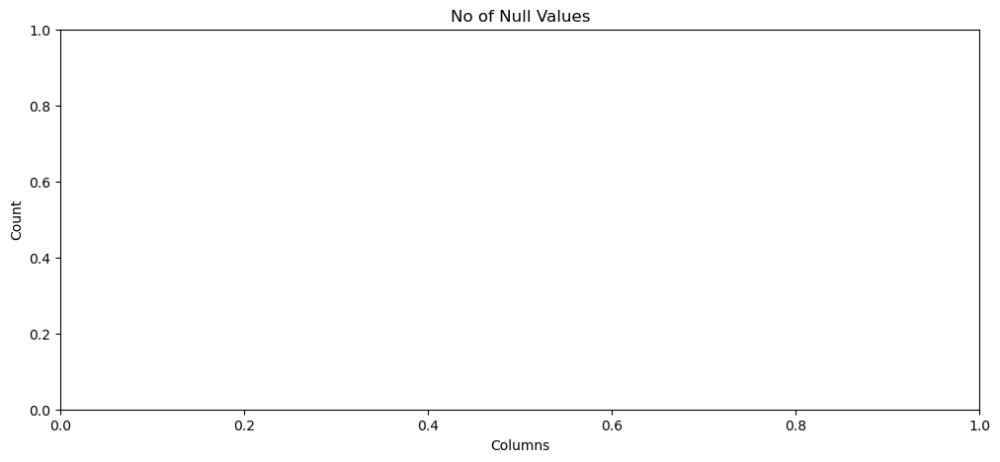

In [34]:
null_vis(df) # fixed null values in all columns

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 85758 entries, 0 to 85906
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   channel_name       85758 non-null  object 
 1   category           85758 non-null  object 
 2   Sub-category       85758 non-null  object 
 3   order_date_time    85758 non-null  object 
 4   Issue_reported at  85758 non-null  object 
 5   issue_responded    85758 non-null  object 
 6   Customer_City      85758 non-null  object 
 7   Product_category   85758 non-null  object 
 8   Item_price         85758 non-null  float64
 9   Agent_name         85758 non-null  object 
 10  Supervisor         85758 non-null  object 
 11  Manager            85758 non-null  object 
 12  Tenure Bucket      85758 non-null  object 
 13  Agent Shift        85758 non-null  object 
 14  CSAT Score         85758 non-null  int64  
dtypes: float64(1), int64(1), object(13)
memory usage: 10.5+ MB


In [36]:
df['Issue_reported at']=pd.to_datetime(df['Issue_reported at'],format='%d/%m/%Y %H:%M',errors='raise') # converting the data types into respective formats.
df['issue_responded']=pd.to_datetime(df['issue_responded'],format='%d/%m/%Y %H:%M',errors='raise')
df['order_date_time']=pd.to_datetime(df['order_date_time'],format='%d/%m/%Y %H:%M',errors='coerce')

In [37]:
df['response_time']=df['issue_responded']-df['Issue_reported at'] # new feature engineered column
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time
0,Outcall,Product Queries,Life Insurance,NaT,2023-08-01 11:13:00,2023-08-01 11:47:00,Unknown,Home Appliences,7994.5,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5,0 days 00:34:00
1,Outcall,Product Queries,Product Specific Information,2023-08-06 23:38:00,2023-08-01 12:52:00,2023-08-01 12:54:00,Unknown,Home Appliences,7994.5,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5,0 days 00:02:00
2,Inbound,Order Related,Installation/demo,2023-08-01 12:12:00,2023-08-01 20:16:00,2023-08-01 20:38:00,Unknown,Electronics,1199.0,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5,0 days 00:22:00
3,Inbound,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-01 20:56:00,2023-08-01 21:16:00,Unknown,Electronics,1199.0,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5,0 days 00:20:00
4,Inbound,Cancellation,Not Needed,2023-08-02 00:42:00,2023-08-01 10:30:00,2023-08-01 10:32:00,Unknown,Books & General merchandise,334.0,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5,0 days 00:02:00


In [38]:
df['response_time']=df['response_time'].dt.total_seconds()/60 # Converting into minutes
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time
0,Outcall,Product Queries,Life Insurance,NaT,2023-08-01 11:13:00,2023-08-01 11:47:00,Unknown,Home Appliences,7994.5,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5,34.0
1,Outcall,Product Queries,Product Specific Information,2023-08-06 23:38:00,2023-08-01 12:52:00,2023-08-01 12:54:00,Unknown,Home Appliences,7994.5,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5,2.0
2,Inbound,Order Related,Installation/demo,2023-08-01 12:12:00,2023-08-01 20:16:00,2023-08-01 20:38:00,Unknown,Electronics,1199.0,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5,22.0
3,Inbound,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-01 20:56:00,2023-08-01 21:16:00,Unknown,Electronics,1199.0,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5,20.0
4,Inbound,Cancellation,Not Needed,2023-08-02 00:42:00,2023-08-01 10:30:00,2023-08-01 10:32:00,Unknown,Books & General merchandise,334.0,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5,2.0


In [39]:
df['response_time']=df['response_time'].apply(int)
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time
0,Outcall,Product Queries,Life Insurance,NaT,2023-08-01 11:13:00,2023-08-01 11:47:00,Unknown,Home Appliences,7994.5,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5,34
1,Outcall,Product Queries,Product Specific Information,2023-08-06 23:38:00,2023-08-01 12:52:00,2023-08-01 12:54:00,Unknown,Home Appliences,7994.5,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5,2
2,Inbound,Order Related,Installation/demo,2023-08-01 12:12:00,2023-08-01 20:16:00,2023-08-01 20:38:00,Unknown,Electronics,1199.0,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5,22
3,Inbound,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-01 20:56:00,2023-08-01 21:16:00,Unknown,Electronics,1199.0,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5,20
4,Inbound,Cancellation,Not Needed,2023-08-02 00:42:00,2023-08-01 10:30:00,2023-08-01 10:32:00,Unknown,Books & General merchandise,334.0,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5,2


In [40]:
df.describe()

,order_date_time,Issue_reported at,issue_responded,Item_price,CSAT Score,response_time
count,84810,85758,85758,85758.000000,85758.000000,85758.000000
mean,2023-08-01 01:36:48.203749376,2023-08-16 22:25:58.667879424,2023-08-17 00:42:49.358427136,3464.134431,4.241983,136.844842
min,2022-01-16 13:15:00,2023-07-28 20:42:00,2023-08-01 00:00:00,0.000000,1.000000,-1437.000000
25%,2023-08-01 00:38:00,2023-08-09 12:48:00,2023-08-09 15:02:00,1199.000000,4.000000,2.000000
50%,2023-08-03 12:17:00,2023-08-16 18:17:30,2023-08-16 20:52:00,1199.000000,5.000000,5.000000
75%,2023-08-06 23:38:00,2023-08-24 17:30:00,2023-08-24 19:23:00,1199.000000,5.000000,35.000000
max,2023-12-08 23:36:00,2023-08-31 23:58:00,2023-08-31 23:59:00,164999.000000,5.000000,5758.000000
std,NaN,NaN,NaN,7355.350302,1.378896,592.214515


In [41]:
df[df['response_time']<0] #Finding negative response time values

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time
74172,Inbound,Refund Related,COD Refund Details,2023-07-24 07:33:00,2023-08-28 16:07:00,2023-08-28,BHAGALPUR,LifeStyle,323.0,Steven Wall,Zoe Yamamoto,Emily Chen,>90,Afternoon,5,-967
74173,Outcall,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-28 16:56:00,2023-08-28,Unknown,Electronics,1199.0,Brittney Key,Mia Yamamoto,Jennifer Nguyen,On Job Training,Morning,3,-1016
74174,Inbound,Payments related,Online Payment Issues,2023-08-17 23:38:00,2023-08-28 20:14:00,2023-08-28,Unknown,Mobile,18999.0,Brian Koch,Ethan Tan,Jennifer Nguyen,On Job Training,Evening,5,-1214
74175,Inbound,Payments related,Billing Related,NaT,2023-08-28 14:37:00,2023-08-28,Unknown,Mobile,18999.0,Ronnie Romero,Aiden Patel,John Smith,>90,Morning,5,-877
74176,Inbound,Returns,Return request,2023-07-24 12:00:00,2023-08-28 23:26:00,2023-08-28,Unknown,Electronics,1199.0,Ann English,Olivia Suzuki,Olivia Tan,On Job Training,Morning,5,-1406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77566,Outcall,Payments related,Payment pending,NaT,2023-08-28 13:25:00,2023-08-28,Unknown,Mobile,18999.0,Tammy Gould,Ava Wong,Jennifer Nguyen,On Job Training,Morning,5,-805
77567,Outcall,Returns,Return request,2023-07-24 12:00:00,2023-08-28 18:09:00,2023-08-28,Unknown,Electronics,1199.0,Cathy Harris,Charlotte Suzuki,William Kim,On Job Training,Morning,5,-1089
77568,Outcall,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-28 22:20:00,2023-08-28,Unknown,Electronics,1199.0,Jessica Cook,Ethan Tan,Michael Lee,>90,Evening,4,-1340
77569,Inbound,Order Related,Order status enquiry,2023-08-04 20:05:00,2023-08-28 14:38:00,2023-08-28,Unknown,Electronics,1199.0,Madison Flores,Ethan Tan,Jennifer Nguyen,On Job Training,Evening,1,-878


In [42]:
print("Percentage of Negative values",len(df[df['response_time']<0])/len(df)*100,"%")

Percentage of Negative values 3.6381445462813966 %


In [43]:
df=df[df["response_time"]>0]  #dropping 3.6% of data
df.describe()

,order_date_time,Issue_reported at,issue_responded,Item_price,CSAT Score,response_time
count,79318,80197,80197,80197.000000,80197.000000,80197.000000
mean,2023-07-31 22:45:06.606066944,2023-08-16 11:16:08.345698816,2023-08-16 14:17:29.010561536,3478.472112,4.229373,181.344414
min,2022-01-16 13:15:00,2023-07-28 20:42:00,2023-08-01 00:00:00,0.000000,1.000000,1.000000
25%,2023-08-01 00:38:00,2023-08-08 22:48:00,2023-08-09 11:17:00,1199.000000,4.000000,2.000000
50%,2023-08-02 22:59:00,2023-08-16 10:25:00,2023-08-16 12:07:00,1199.000000,5.000000,6.000000
75%,2023-08-06 23:38:00,2023-08-23 19:47:00,2023-08-23 21:48:00,1199.000000,5.000000,43.000000
max,2023-12-08 23:36:00,2023-08-31 23:58:00,2023-08-31 23:59:00,164999.000000,5.000000,5758.000000
std,NaN,NaN,NaN,7404.928906,1.388515,572.566951


In [44]:
print(f"Data Retained {round(len(df)/original*100,2)} % of original data")

Data Retained 93.35 % of original data


##### Dataframes for Visualization

In [45]:
# Year-wise order count dataframe
year_wise=df['order_date_time'].dt.year.value_counts().to_frame().reset_index() # extracting year from order_date_time column
year_wise.columns=['Year','Count']
year_wise['Year']=year_wise['Year'].apply(int)
year_wise=year_wise.sort_values('Count',ascending=False)
year_wise

,Year,Count
0,2023,79121
1,2022,197


In [46]:
# Month-wise order count dataframe
order_months=df['order_date_time'].dt.month.value_counts().to_frame().reset_index() # extracting month from order_Date_time column
order_months.columns=['Month','Count']
order_months=order_months.sort_values('Count',ascending=False)
order_months['Month']=order_months['Month'].replace({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
order_months

,Month,Count
0,Aug,63225
1,Jul,14329
2,Jun,987
3,May,338
4,Apr,80
5,Sep,79
6,Mar,66
7,Oct,56
8,Feb,44
9,Dec,43


In [47]:
# Day-wise order count dataframe
order_days=df['order_date_time'].dt.day_name().value_counts().to_frame().reset_index() # extracting dayname from order_date_time column
order_days.columns=['Day','Count']
order_days=order_days.sort_values('Count',ascending=False)
order_days

,Day,Count
0,Tuesday,26413
1,Friday,12246
2,Monday,11884
3,Wednesday,8677
4,Sunday,7768
5,Thursday,6320
6,Saturday,6010


In [48]:
# Hour-wise order count dataframe
order_hours=df['order_date_time'].dt.hour.value_counts().to_frame().reset_index() #extracting hour from order_date_time column
order_hours.columns=['Hour','Count']
order_hours=order_hours.sort_values('Count',ascending=False)
order_hours

,Hour,Count
0,0.0,19619
1,12.0,13711
2,11.0,6372
3,23.0,6115
4,20.0,5720
5,9.0,3854
6,16.0,3677
7,17.0,2979
8,22.0,2841
9,10.0,2724


In [49]:
# Response time in individual channels dataframe
channel_respose=df.groupby('channel_name')['response_time'].mean().to_frame().reset_index()
channel_respose=channel_respose.sort_values('response_time',ascending=False)
channel_respose['response_time']=channel_respose['response_time'].apply(lambda x: round(x,2)) # rounding to 2 digits
channel_respose

,channel_name,response_time
0,Email,226.41
1,Inbound,180.27
2,Outcall,177.20


In [50]:
# Product category wise response time dataframe
product_category_response=df.groupby('Product_category')['response_time'].mean().to_frame().reset_index()
product_category_response=product_category_response.sort_values('response_time',ascending=False)
product_category_response['response_time']=product_category_response['response_time'].apply(lambda x: round(x,2))
product_category_response

,Product_category,response_time
4,GiftCard,889.28
5,Home,522.25
3,Furniture,506.87
0,Affiliates,399.12
1,Books & General merchandise,307.99
7,LifeStyle,292.75
6,Home Appliences,270.57
8,Mobile,207.82
2,Electronics,129.40


In [51]:
# Issue category wise response time dataframe
category_respose=df.groupby('category')['response_time'].mean().to_frame().reset_index()
category_respose=category_respose.sort_values('response_time',ascending=False)
category_respose['response_time']=category_respose['response_time'].apply(lambda x: round(x,2))
category_respose

,category,response_time
4,Others,274.87
2,Offers & Cashback,229.12
0,Cancellation,206.79
6,Product Queries,199.35
1,Feedback,193.58
8,Returns,190.72
7,Refund Related,180.56
3,Order Related,161.24
9,Shopzilla Related,157.19
5,Payments related,150.34


In [52]:
# City wise orde count dataframe
customer_locality=df['Customer_City'].value_counts().to_frame().reset_index()
customer_locality.columns=['Cities','Count']
customer_locality=customer_locality.sort_values('Count',ascending=False)
customer_locality=customer_locality[customer_locality['Cities']!='Unknown'] 

f=customer_locality['Count'].unique()
print("Mean Count",f.mean())
customer_locality=customer_locality[customer_locality['Count']>f.mean()] #contains so many cities so removing cities whose order count is less than mean
customer_locality

Mean Count 88.55813953488372


,Cities,Count
1,HYDERABAD,678
2,NEW DELHI,658
3,PUNE,417
4,MUMBAI,384
5,BANGALORE,340
6,KOLKATA,260
7,CHENNAI,253
8,LUCKNOW,245
9,AHMEDABAD,242
10,JAIPUR,226


In [53]:
# Count of issue categories with product categories dataframe
product_wise_category=df.groupby(['Product_category','category'])['category'].count().to_frame()
product_wise_category.columns=['Count']
product_wise_category.reset_index(inplace=True)
product_wise_category=product_wise_category.sort_values('Count',ascending=False)
product_wise_category

,Product_category,category,Count
24,Electronics,Returns,36359
19,Electronics,Order Related,16795
57,Home Appliences,Product Queries,3522
67,LifeStyle,Refund Related,3465
78,Mobile,Shopzilla Related,2591
...,...,...,...
28,Furniture,Offers & Cashback,1
73,Mobile,Others,1
47,Home,Product Queries,1
5,Affiliates,Shopzilla Related,1


In [54]:
# Count of Sub-category issues with product categories dataframe
product_wise_sub_category=df.groupby(['Product_category','Sub-category'])['Sub-category'].count().to_frame()
product_wise_sub_category.columns=['Count']
product_wise_sub_category.reset_index(inplace=True)
product_wise_sub_category=product_wise_sub_category.sort_values('Count',ascending=False)
product_wise_sub_category

,Product_category,Sub-category,Count
74,Electronics,Reverse Pickup Enquiry,18240
73,Electronics,Return request,7447
63,Electronics,Order status enquiry,5045
53,Electronics,Delayed,4031
57,Electronics,Installation/demo,3674
...,...,...,...
220,Mobile,Call disconnected,1
101,Furniture,Return cancellation,1
97,Furniture,Policy Related,1
96,Furniture,Payment related Queries,1


In [55]:
# Response time for each sub-category grouped by product category dataframe
product_wise_sub_category_response=df.groupby(['Product_category','Sub-category'])['response_time'].mean().to_frame()
product_wise_sub_category_response.columns=['Response_time']
product_wise_sub_category_response.reset_index(inplace=True)
product_wise_sub_category_response['Response_time']=product_wise_sub_category_response['Response_time'].apply(lambda x: round(x,2))
product_wise_sub_category_response

,Product_category,Sub-category,Response_time
0,Affiliates,Customer Requested Modifications,662.00
1,Affiliates,Delayed,160.35
2,Affiliates,Fraudulent User,567.20
3,Affiliates,General Enquiry,2.00
4,Affiliates,Missing,901.20
...,...,...,...
253,Mobile,Unable to Login,27.00
254,Mobile,Wallet related,74.54
255,Mobile,Warranty related,2025.00
256,Mobile,Wrong,318.08


In [56]:
# Response time for each catagory grouped by product category dataframe
product_wise_category_response=df.groupby(['Product_category','category'])['response_time'].mean().to_frame()
product_wise_category_response.columns=['Response_time']
product_wise_category_response.reset_index(inplace=True)
product_wise_category_response

,Product_category,category,Response_time
0,Affiliates,Cancellation,13.500000
1,Affiliates,Feedback,25.200000
2,Affiliates,Order Related,273.552632
3,Affiliates,Refund Related,387.555556
4,Affiliates,Returns,475.211538
...,...,...,...
74,Mobile,Payments related,136.273245
75,Mobile,Product Queries,2025.000000
76,Mobile,Refund Related,390.018750
77,Mobile,Returns,409.228346


In [57]:
# Agent's CSAT score and Response time dataframe
agent_csat=df.groupby('Agent_name')[['CSAT Score','response_time']].mean().reset_index()
agent_csat=agent_csat.sort_values('CSAT Score',ascending=False)
agent_csat['CSAT Score']=agent_csat['CSAT Score'].apply(lambda x: round(x,2))

print("Total Agents :",len(agent_csat))

agent_above=agent_csat[agent_csat['CSAT Score']>=agent_csat['CSAT Score'].mean()]
print("Agents Above Average :",len(agent_above))
agent_below=agent_csat[agent_csat['CSAT Score']<agent_csat['CSAT Score'].mean()]
print("Agents Below Average :",len(agent_below))

agent_csat=pd.concat([agent_above.head(),agent_below.tail()]) # extracting top and under performing agents for easier visualizations
agent_csat['response_time']=agent_csat['response_time'].apply(lambda x: round(x,2))
agent_csat

Total Agents : 1371
Agents Above Average : 775
Agents Below Average : 596


,Agent_name,CSAT Score,response_time
1016,Pamela Robinson,4.96,231.57
1164,Sean Gay,4.91,24.14
1338,Virginia Lane,4.90,88.58
707,Kelsey Richardson,4.89,204.21
977,Nancy Singh,4.88,66.59
281,Curtis Mccarthy,2.10,321.10
1348,Wesley Meyer,2.08,109.17
1045,Philip Harmon,2.06,411.69
1364,Willie Flores,1.94,276.62
1063,Rebecca Miller,1.70,36.45


In [58]:
# Tenure wise CSAT Scores dataframe
tenure_c=df.groupby('Tenure Bucket')['CSAT Score'].mean().to_frame().reset_index()
tenure_c=tenure_c.sort_values('CSAT Score',ascending=False)
tenure_c['CSAT Score']=tenure_c['CSAT Score'].apply(lambda x: round(x,2))
tenure_c

,Tenure Bucket,CSAT Score
2,61-90,4.34
1,31-60,4.28
3,>90,4.26
0,0-30,4.25
4,On Job Training,4.12


In [59]:
# Tenure wise response time dataframe
tenure_r=df.groupby('Tenure Bucket')['response_time'].mean().to_frame().reset_index()
tenure_r=tenure_r.sort_values('response_time',ascending=False)
tenure_r['response_time']=tenure_r['response_time'].apply(lambda x: round(x,2))
tenure_r

,Tenure Bucket,response_time
3,>90,191.63
2,61-90,183.31
4,On Job Training,181.43
0,0-30,168.86
1,31-60,165.27


In [60]:
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time
0,Outcall,Product Queries,Life Insurance,NaT,2023-08-01 11:13:00,2023-08-01 11:47:00,Unknown,Home Appliences,7994.5,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5,34
1,Outcall,Product Queries,Product Specific Information,2023-08-06 23:38:00,2023-08-01 12:52:00,2023-08-01 12:54:00,Unknown,Home Appliences,7994.5,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5,2
2,Inbound,Order Related,Installation/demo,2023-08-01 12:12:00,2023-08-01 20:16:00,2023-08-01 20:38:00,Unknown,Electronics,1199.0,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5,22
3,Inbound,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-01 20:56:00,2023-08-01 21:16:00,Unknown,Electronics,1199.0,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5,20
4,Inbound,Cancellation,Not Needed,2023-08-02 00:42:00,2023-08-01 10:30:00,2023-08-01 10:32:00,Unknown,Books & General merchandise,334.0,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5,2


### What all manipulations have you done?

* **Dropping Columns :** "*Unique id*","*Customer Remarks*","*Order_id*" are being dropped because of irrelevance for the analysis.
* **Handling Missing Values :** 
    * **Created a function null_vis** for visualization of null value counts in dataframe.
    * **Filling with mode and median** by aggregating columns by category  and **Dropping of Columns** containg most of the null values.
* **Data type conversions :** Converted "*Issue_reported at*", "*issue_responded*", "*order_date_time*" columns into datetime datatype.
* **Feature Engineering :** created "*response_time*" by substracting issue reported time from response time
* **Filtering illogical data :** negative "*response_time*" values have been removed
* **Created DataFrames with different features for Visualization**

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [61]:
# Chart - 1 visualization code
fig1 = make_subplots(rows=2, cols=2, subplot_titles=("Year-Wise Order Count", "Month-Wise Order Count", "Day-Wise Order Count","Hour-Wise Order Count"))

fig1.add_trace(go.Bar(x=year_wise['Year'], y=year_wise['Count'], marker_color='deepskyblue', name='Year wise Orders',text=year_wise['Count']), row=1, col=1)
fig1.add_trace(go.Bar(x=order_months['Month'], y=order_months['Count'], marker_color='orange', name='Month wise Orders',text=order_months['Count']), row=1, col=2)
fig1.add_trace(go.Bar(x=order_hours['Hour'], y=order_hours['Count'], marker_color='red', name='Hour wise Orders',text=order_hours['Count']), row=2, col=2)
fig1.add_trace(go.Bar(x=order_days['Day'], y=order_days['Count'], marker_color='green', name='Day wise Orders',text=order_days['Count']), row=2, col=1)

fig1.update_xaxes(tickmode='array', tickvals=year_wise['Year'].unique(), ticktext=year_wise['Year'].unique(), row=1, col=1)
fig1.update_xaxes(tickmode='array',tickvals=order_months["Month"].unique(),ticktext=order_months["Month"].unique(), row=1, col=2)
fig1.update_xaxes(tickmode='array',tickvals=order_hours["Hour"].unique(),ticktext=order_hours["Hour"].unique(), row=2, col=2)
fig1.update_xaxes(tickmode='array',tickvals=order_days["Day"].unique(),ticktext=order_days["Day"].unique(), row=2, col=1)


fig1.update_layout(title_text="Order Distribution", showlegend=True,title_x=0.5)

fig1.show(config={'staticPlot': True})

##### 1. Why did you pick the specific chart?

* **Provides Comprehensive Overview** of the order distribution across different time dimensions (year,month,day,hour) and allows us to compare and observe any pattern.

##### 2. What is/are the insight(s) found from the chart?

* **Year-Wise :** Significant Increase in orders from 2022 to 2023, indicating substantial growth
* **Month-Wise :** Auguest shows highest number of orders (63,225) followed by July (14,308) and there is sharp decline in orders in other months indicating seasonality or promotional effect in Auguest.
* **Day-Wise :** Tuesday has highest orders (26,413) followed by Friday (12,246) and week-ends have lowest order counts.
* **Hour-Wise :** Orders are peak at 12 AM (19,619)indicating starting of any event on the platform and reduce during 1-8 AM probably due to sleeping. 
Sudden spike around 12 PM and gradual increase after 4 PM.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impacts :**
    * **Resource Optimization :** Knowing Peak order times like (Augest, Tuesdays, midnight and midday) allows company to allocate resources efficiently like more staff during peak hours for improved Customer Service and targeted Marketing campaigns.
* **Negative Impacts :**
    * **Seasonality :** Despite Auguest and July, there was a decline in orders suggesting lack of events or promotions which can lead to revenue fluctuations
    * **Low weekend orders :** Explore strategies to boost weekend sales.


#### Chart - 2

In [62]:
# Chart - 2 visualization code
fig2 = px.treemap(product_wise_category, 
                 path=["Product_category", "category"], 
                 values="Count", 
                 title="Distribution of Issues by Product Category")

fig2.show()


##### 1. Why did you pick the specific chart?

* **Treemap** is used to visualize hierarchical data showing relative proportions of different categories within a whole.
* **Provides Quick understanding** of the distribution of issues accross carious product categories.

##### 2. What is/are the insight(s) found from the chart?

* **Electronics Dominates :** the primary issue within electronics is returns, order related which may indicate faulty products or mismatch of user requirements.
* **Lifestyle :** Refund Related and returns dominate in this category. Next to Electronics.
* **Mobile :** Platform related, payments related and order related issues dominates in this category. 
* **Books & General Merchandise :** Feedback, cancellations are the dominating issues in this category. 
* **Home Appliances :** Product queries is the major issue.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 3

In [63]:
# Chart - 3 visualization code
fig3 = px.treemap(product_wise_sub_category, 
                 path=["Product_category", "Sub-category"], 
                 values="Count", 
                 title="Distribution of Issues by Product Sub-Category")

fig3.show()

##### 1. Why did you pick the specific chart?

* **Treemap** is used to visualize hierarchical data showing relative proportions of different categories within a whole.
* **Provides Quick understanding** of the distribution of issues accross carious product categories.

##### 2. What is/are the insight(s) found from the chart?

* **Electronics Dominates :** Reverse Pickup enquiry, return request, order status enquiry, delayed are the dominating sub category issues.
* **LifeStyle :** Return enquiry, Reverse Pickup Enquiry and Refund related issues dominates among this category.
* **Mobile :** General enquiry, Online Payment issues, Payment related queries are dominant.
* **Books & General Merchandise :** Unprofessional Behaviour, Not required , Delayed are the dominant issues.
* **Home Appliences :** Product Specific information, Delayed orders are the major issues. 

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * **Targeted problem solving :** Company can focus on major issues related to different product categories thereby increasing CSAT Score.
    * **Process Improvements :** Addressing delayed issues like shipping and delivery process need to be optimized.

* **Negative Impact :**
    * **Reverse Pickup Enquiry, Delayes accross multiple categories** leads to additional costs and that needs to be addressed.

#### Chart - 4

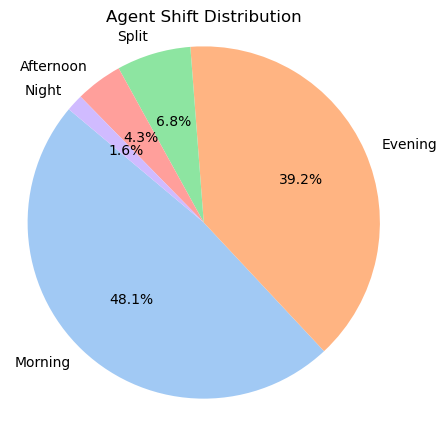

In [64]:
# Chart - 4 visualization code
plt.figure(figsize=(5, 5))
plt.pie(df['Agent Shift'].value_counts(), labels=df['Agent Shift'].unique(), autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Agent Shift Distribution')
plt.axis('equal')
plt.show()

##### 1. Why did you pick the specific chart?

* This pie chart represents the distribution of Agent shifts indicating number of agents alloting to a particular shifts.

##### 2. What is/are the insight(s) found from the chart?

* **Morning Dominance and Significant Evening shifts**
* **Less shifts in Night and Afternoon**


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * If the orders have huge demand in afternoons and nights, there is need to increase the number of agents working in those shifts.
* **Negative Impact :**
    * Huge amount of Morning and Evening shifts can cause burnout of agents in those shifts.

#### Chart - 5

In [65]:
# Chart - 5 visualization code
fig5=px.histogram(df,x='CSAT Score',title='CSAT Score Distribution',nbins=10,text_auto=True)
fig5.show(config={'staticPlot': True})

##### 1. Why did you pick the specific chart?

* **Histograms** are better in analyzing a single feature and understanding its distribution. By this chart we can understand the distribution of the frequency of CSAT scores.

##### 2. What is/are the insight(s) found from the chart?

* Most of the Customers are very satisfied with the company. 
* Low scores are minimal
* **Overall positive trend**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impacts :**
    * **Identify Areas for improvement with low scores**


#### Chart - 6

In [66]:
# Chart - 6 visualization code
fig6=px.histogram(df,x='response_time',title='Response Time Distribution',nbins=10,text_auto=True)
fig6.show(config={'staticPlot': True})

##### 1. Why did you pick the specific chart?

Histogram represents the distribution of response time.Those are effective in understanding the frequency of single variable.

##### 2. What is/are the insight(s) found from the chart?

* **Dominant Fast Response :** Indicates vast majority of issues are handles very quickly.
* **Decreasing frequency with time :** Indicating much fewer responses take much time.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * **Highlights Efficiency**
* **Negative Impact :**
    * **Understanding Long response times**

#### Chart - 7

In [67]:
# Chart - 7 visualization code
fig7=px.histogram(df,x='Item_price',title='Item Price Distribution',nbins=10,text_auto=True)
fig7.show(config={'staticPlot': True})

##### 1. Why did you pick the specific chart?

To understand the frequency of distribution of Item Prices.

##### 2. What is/are the insight(s) found from the chart?

* **Dominant Low Priced Items :** Indicates majority of items are priced low.
* **Rapid Decline in Frequency :*** The frequency of items drops significantly as the price increases. The next highest count is 6,802, which is drastically lower than the first bar.
* **Rare High Price Items :** Items with prices above 50k are extremely rare, with very low counts (56, 34, 14, 4, 3). This suggests specialized products in these higher price ranges.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * **Focus on selling low priced items by targeted marketing**
* **Negative Impact :**
    * **Potential for Low Profit**
    * **Limited Exposure to High Cost Items**

#### Chart - 8

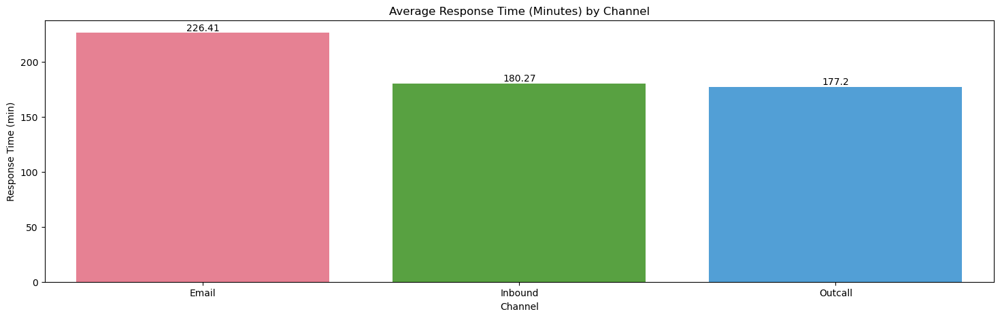

In [68]:
# Chart - 8 visualization code
plt.figure(figsize=(18,5))
sns.barplot(x=channel_respose['channel_name'],y=channel_respose['response_time'],palette='husl',hue=channel_respose['channel_name'])
for i, value in enumerate(channel_respose['response_time']):
    plt.annotate(str(value), xy=(i, value), ha='center', va='bottom')
plt.title("Average Response Time (Minutes) by Channel")
plt.xlabel('Channel')
plt.ylabel("Response Time (min)")
plt.show()

##### 1. Why did you pick the specific chart?

* This is a bar chart that displays the average response time (in minutes) for different communication channels: Email, Inbound, and Outcall. 
* It effectively compares the average response times across these channels, allowing for a quick understanding of which channel has the fastest or slowest response times.

##### 2. What is/are the insight(s) found from the chart?

* **Emails have the longest response time**
* **Inbound and Outcall have similar response time with outcall is slightly faster**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Postive Impact :**
    * **Improving Response time over emails** will futher lead to increase in CSAT Score.
* **Negative Impact :**
    * **Longer Email Response Times**

#### Chart - 9

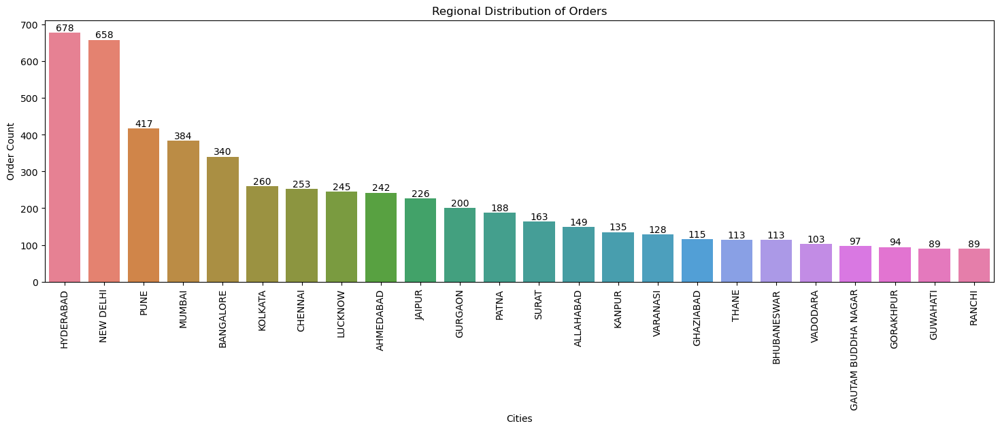

In [69]:
# Chart - 9 visualization code
plt.figure(figsize=(18,5))
sns.barplot(x=customer_locality['Cities'],y=customer_locality['Count'],palette='husl',hue=customer_locality['Cities'])
for i, value in enumerate(customer_locality['Count']):
    plt.annotate(str(value), xy=(i, value), ha='center', va='bottom')
plt.title("Regional Distribution of Orders")
plt.xlabel('Cities')
plt.xticks(rotation=90)
plt.ylabel("Order Count")
plt.show()

##### 1. Why did you pick the specific chart?

* It effectively compares the order counts for each city, allowing for a quick understanding of which cities have the highest and lowest order volumes

##### 2. What is/are the insight(s) found from the chart?

* **Hyderabad leads in order count**
* **New Delhi and Pune are next to Hyderabad**
* **Lower Order Counts in Smaller Cities :** Cities like Gautam Buddha Nagar, Gorakhpur, Guwahati, and Ranchi have significantly lower order counts, suggesting less market penetration or lower demand in these regions.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Postive Impacts :**
    * **Targeted marketing in high performing cities**
* **Negative Impacts :**
    * **Underperforming in Smaller cities**

#### Chart - 10

In [70]:
# Chart - 10 visualization code
fig10 = go.Figure(data=[go.Box(x=df['Product_category'], y=df['Item_price'], marker_color='darkviolet', name='Item Price')])
fig10.update_layout(title_text='Product Category vs Item Price',title_x=0.5)
fig10.show()

##### 1. Why did you pick the specific chart?

* Box plot displays the distribution of item prices across different product categories. It effectively shows the median, quartiles, and outliers of item prices within each category, allowing for a quick understanding of the price range and spread of items in each category.

##### 2. What is/are the insight(s) found from the chart?

* **High prices in Electronics and Mobiles** indicating premium products
* **Home Appliances, Books & General Merchandise, LifeStyle, Home, GiftCard, and Affiliates** have Lower Price Ranges: These categories generally have lower median prices and smaller ranges, indicating a focus on lower-priced items.
* **Outlies indicate Premium Items**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * **Targeted Marketing and Pricing strategies**
* **Negative Impact :**
    **Potential for Customer Dissatisfaction :** If the company focuses too heavily on low-priced items, they might miss out on potential revenue from customers looking for higher-quality or premium products.

#### Chart - 11

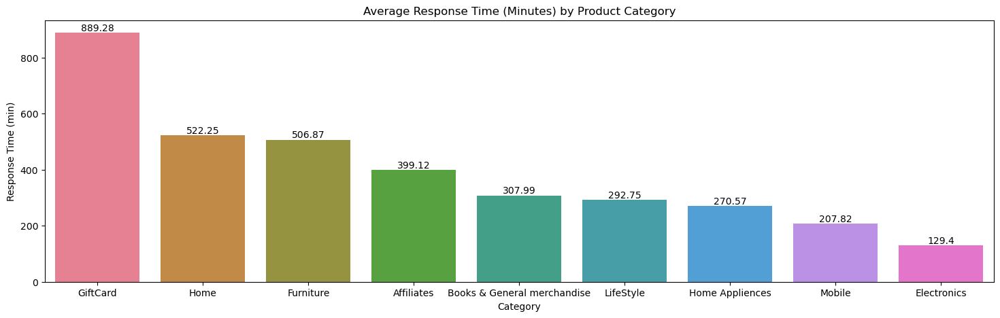

In [71]:
# Chart - 11 visualization code
plt.figure(figsize=(18,5))
sns.barplot(x=product_category_response['Product_category'],y=product_category_response['response_time'],palette='husl',hue=product_category_response['Product_category'])
for i, value in enumerate(product_category_response['response_time']):
    plt.annotate(str(value), xy=(i, value), ha='center', va='bottom')
plt.title("Average Response Time (Minutes) by Product Category")
plt.xlabel('Category')
plt.ylabel("Response Time (min)")
plt.show()

##### 1. Why did you pick the specific chart?

* **Bar Graphs** offer comparision between categories and easier to understand.

##### 2. What is/are the insight(s) found from the chart?

* **Giftcard has the longest Response time followed by Home and Furniture**
* **Categories towards right are handled more effectively**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Postive Impacts :**
    * **Identify areas for improvement** in categories like GiftCard, Home, and Furniture.
    * **Improve Response time** resulting in increase of CSAT Score.

#### Chart - 12

In [72]:
# Chart - 12 visualization code
fig12 = make_subplots(rows=2, cols=1, subplot_titles=("Agent Wise CSAT Score (Top and Under Performing Agents)", "Agent Wise Response Time"))

fig12.add_trace(go.Bar(x=agent_csat['Agent_name'], y=agent_csat['CSAT Score'], marker_color='deepskyblue',text=agent_csat['CSAT Score']), row=1, col=1)
fig12.add_trace(go.Bar(x=agent_csat['Agent_name'], y=agent_csat['response_time'], marker_color='orange',text=agent_csat['response_time']), row=2, col=1)


fig12.update_xaxes(tickmode='array', tickvals=agent_csat['Agent_name'].unique(), ticktext=agent_csat['Agent_name'].unique(), row=1, col=1)
fig12.update_xaxes(tickmode='array',tickvals=agent_csat['Agent_name'].unique(),ticktext=agent_csat['Agent_name'].unique(), row=2, col=1)


fig12.update_layout(title_text="Agent Performance Overview", title_x=0.5)

fig12.show(config={'staticPlot': True})

##### 1. Why did you pick the specific chart?

* This chart displays two different aspects of agent performance: CSAT Score and Response Time. This allows for a quick comparison of both metrics for each agent, highlighting areas for improvement.

##### 2. What is/are the insight(s) found from the chart?

* **CSAT Score :**
    * **Top Performers :** Pamela Robinson, Sean Gay, Virginia Lane, Kelsey Richardson, and Nancy Singh have high CSAT scores (above 4.88).
    * **Under Performers :** Curtis Mccarthy, Wesley Meyer, Philip Harmon, Willie Flores, and Rebecca Miller have significantly lower CSAT scores (below 2.1).
* **Response Time :**
    * **Fastest Responders :** Sean Gay, Nancy Singh, and Rebecca Miller have the fastest response times (below 100 minutes)
    * **Slowest Responders :** Philip Harmon, Curtis Mccarthy, and Pamela Robinson have the slowest response times (above 200 minutes)
    * **Moderate Responders :** Virginia Lane, Kelsey Richardson, and Willie Flores have moderate response times (between 100 and 200 minutes)


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impacts :**
    * **Targeted Training and Coaching** for underperforming agents to improve CSAT Scores.
    * **Recognition and Rewards** for high performing agents to encourage others.
* **Neagative Impacts :**
    * **High Performing agents** may be subjected to burnout. They need to be ensured they are not over worked.

#### Chart - 13

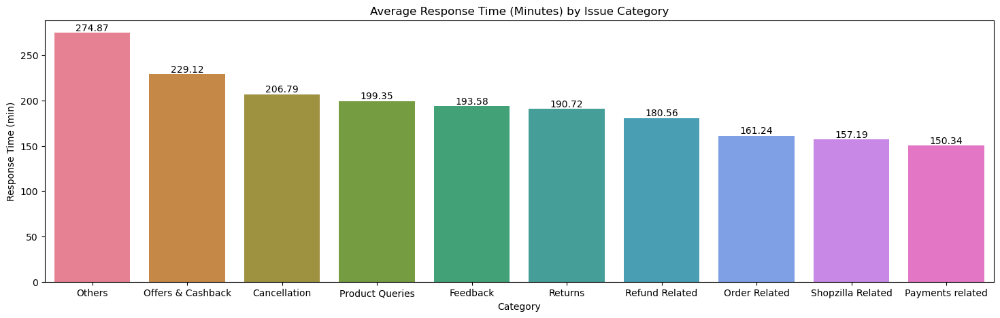

In [73]:
# Chart - 13 visualization code
plt.figure(figsize=(18,5))
sns.barplot(x=category_respose['category'],y=category_respose['response_time'],palette='husl',hue=category_respose['category'])
for i, value in enumerate(category_respose['response_time']):
    plt.annotate(str(value), xy=(i, value), ha='center', va='bottom')
plt.title("Average Response Time (Minutes) by Issue Category")
plt.xlabel('Category')
plt.ylabel("Response Time (min)")
plt.show()

##### 1. Why did you pick the specific chart?

This chart represents reponse time for various issue categories allowing us to compare and provide actionable insights.

##### 2. What is/are the insight(s) found from the chart?

* **Others** have the longest response time followed by **Offers & Cashback**.
* **Payments related** has teh shorted response time indicating efficient handling of issues related to payments.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Postive Impacts :**
    * **Identifies Areas for Improvement :** The chart highlights the need to improve response times for "Others," Offers & Cashback, and Cancellation categories. The company can focus on streamlining processes or provide training to reduce response times

* **Negative Impacts :**
    * **Extremely Long Response Times for "Others" :** The extremely long response time for the "Others" category could indicate a lack of clarity or categorization issues. This could lead to customer frustration and dissatisfaction.

#### Chart - 14

In [74]:
# Chart - 14 visualization code
fig14 = px.bar(product_wise_sub_category_response, x="Product_category", y="Response_time", color="Sub-category",
             title="Average Response Time by Product Sub-Category",
             barmode="group", text="Response_time")

fig14.update_traces(texttemplate='%{text:.2f}', textposition="outside")
fig14.show()

##### 1. Why did you pick the specific chart?

* This chart displays the average responsetime for different product sub-categories within each product category. It gives detailed comparision of response times.

##### 2. What is/are the insight(s) found from the chart?

The Longest response time for different Product categories include
* **Books & General Merchandise :** Product specific Information
* **Electronics :** Product Specific information
* **Furniture :** Policy related
* **Home :** Service-center - Service Denied
* **Home Appliences :** Card EMI, Service Denial
* **Lifestyle :** Self- Help
* **Mobiles :** Calls Disconnectivity
* **Giftcard :** Exchange and Replacement


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Postive Impacts :**
    * **Identifies Areas for Improvement :** The chart highlights the need to improve response times for "Product specific information, service denial categories. The company can focus on streamlining processes or provide training to reduce response times

#### Chart - 15

In [75]:
# Chart 15 visualization code
fig15 = px.bar(product_wise_category_response, x="Product_category", y="Response_time", color="category",
             title="Average Response Time by Product Category",
             barmode="group", text="Response_time")

fig15.update_traces(texttemplate='%{text:.2f}', textposition="outside")
fig15.show()

##### 1. Why did you pick the specific chart?

* This chart displays the average response time for different product categories within each product category. It gives detailed comparision of response times.

##### 2. What is/are the insight(s) found from the chart?

The Longest response times for the issue categories among product categories are:
* **Affiliates :** Returns
* **Books & General Merchandise :** Product Queries
* **Electronics :** Product queries followed by Offers & Cashback
* **Furniture :** Product Queries
* **Home :** Offers & Cashback, Platform related.
* **Home Appliances :** Cashback related and Payments related.
* **Lifestyle :** Payments and returns.
* **Mobiles :** others and product queries
* **Giftcard :** returns and others.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Postive Impacts :**
    * **Identifies Areas for Improvement :** The chart highlights the need to improve response times for "Product Queries", "Payment related" and "Platform related" categories. The company can focus on streamlining processes or provide training to reduce response times

#### Chart - 16 

In [76]:
# Chart 16 visualization code
fig16 = make_subplots(rows=2, cols=1, subplot_titles=("Tenure Bucket Wise CSAT Score", "Tenure Bucket Wise Response Score"))

fig16.add_trace(go.Bar(x=tenure_c["Tenure Bucket"], y=tenure_c['CSAT Score'], marker_color='deepskyblue',text=tenure_c['CSAT Score']), row=1, col=1)
fig16.add_trace(go.Bar(x=tenure_r["Tenure Bucket"], y=tenure_r['response_time'], marker_color='orange',text=tenure_r['response_time']), row=2, col=1)


fig16.update_xaxes(tickmode='array', tickvals=tenure_c["Tenure Bucket"].unique(), ticktext=tenure_c["Tenure Bucket"].unique(), row=1, col=1)
fig16.update_xaxes(tickmode='array',tickvals=tenure_r["Tenure Bucket"].unique(),ticktext=tenure_r["Tenure Bucket"].unique(), row=2, col=1)


fig16.update_layout(title_text="Tenure Bucket Overview", title_x=0.5)

fig16.show(config={'staticPlot': True})

##### 1. Why did you pick the specific chart?

* Two different aspects of performance based on agent tenure: CSAT Score and Response Score.
* Compares two metrics across different tenure buckets, allowing for a quick understanding of how tenure impacts performance.

##### 2. What is/are the insight(s) found from the chart?

* **CSAT Score :**
    * **Relatively Consistant across different Tenures** implying no impact on CSAT Scores
    * **Highest in 61-90 Days (4.34) and Lowest in On Job Training (4.12)**

* **Response Score :**
    * **Decreasing with Tenure**
    * **Better at 31-60 and worst at >90**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * **Targeted Training**

* **Negative Impact :**
    * **Potential for Overlooking Individual Performance**


#### Chart - 17

In [77]:
# Chart- 17 visualization Code
for x1 in df["Agent Shift"].unique():
    fig17=px.histogram(df[df["Agent Shift"]==x1],x='response_time',title=f'{x1} shift Response Time Distribution',nbins=10,text_auto=True)
    fig17.show()

##### 1. Why did you pick the specific chart?

To understand the frequency of distribution of response time in different Agent shifts

##### 2. What is/are the insight(s) found from the chart?

* **Overall Dominance of Fast Responses :** Across all shifts, the vast majority of responses fall within the 0-1000 time range, indicating a generally efficient response system.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* **Positive Impact :**
    * **Targeted Improvements :** Company can target for specific shifts for process improvements, training.
    * **Improved Customer Experience**

In [78]:
# Preparing Dataframe for Correlation and Pairplots
df.head()

,channel_name,category,Sub-category,order_date_time,Issue_reported at,issue_responded,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time
0,Outcall,Product Queries,Life Insurance,NaT,2023-08-01 11:13:00,2023-08-01 11:47:00,Unknown,Home Appliences,7994.5,Richard Buchanan,Mason Gupta,Jennifer Nguyen,On Job Training,Morning,5,34
1,Outcall,Product Queries,Product Specific Information,2023-08-06 23:38:00,2023-08-01 12:52:00,2023-08-01 12:54:00,Unknown,Home Appliences,7994.5,Vicki Collins,Dylan Kim,Michael Lee,>90,Morning,5,2
2,Inbound,Order Related,Installation/demo,2023-08-01 12:12:00,2023-08-01 20:16:00,2023-08-01 20:38:00,Unknown,Electronics,1199.0,Duane Norman,Jackson Park,William Kim,On Job Training,Evening,5,22
3,Inbound,Returns,Reverse Pickup Enquiry,2023-08-01 00:38:00,2023-08-01 20:56:00,2023-08-01 21:16:00,Unknown,Electronics,1199.0,Patrick Flores,Olivia Wang,John Smith,>90,Evening,5,20
4,Inbound,Cancellation,Not Needed,2023-08-02 00:42:00,2023-08-01 10:30:00,2023-08-01 10:32:00,Unknown,Books & General merchandise,334.0,Christopher Sanchez,Austin Johnson,Michael Lee,0-30,Morning,5,2


In [79]:
df['order_day']=df['order_date_time'].dt.day_name()
categorical_cols = ['channel_name', 'category', 'Sub-category', 'Customer_City', 
                    'Product_category', 'Agent_name', 'Supervisor', 'Manager', 
                    'Tenure Bucket', 'Agent Shift',"order_day"]
df['order_month']=df['order_date_time'].dt.month
df.drop(['order_date_time', 'Issue_reported at', 'issue_responded'],axis=1,inplace=True)
df.dropna(inplace=True)

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))  # label encoding text data for correlation
    label_encoders[col] = le

df.head()

,channel_name,category,Sub-category,Customer_City,Product_category,Item_price,Agent_name,Supervisor,Manager,Tenure Bucket,Agent Shift,CSAT Score,response_time,order_day,order_month
1,2,6,24,1695,6,7994.5,1323,9,3,3,2,5,2,3,8.0
2,1,3,11,1695,2,1199.0,370,18,5,4,1,5,22,5,8.0
3,1,8,30,1695,2,1199.0,1024,33,2,3,1,5,20,5,8.0
4,1,0,15,1695,1,334.0,247,4,3,0,2,5,2,6,8.0
5,0,8,9,1695,2,1199.0,347,12,2,0,2,5,206,2,8.0


#### Chart 18 - Correlation Heatmap

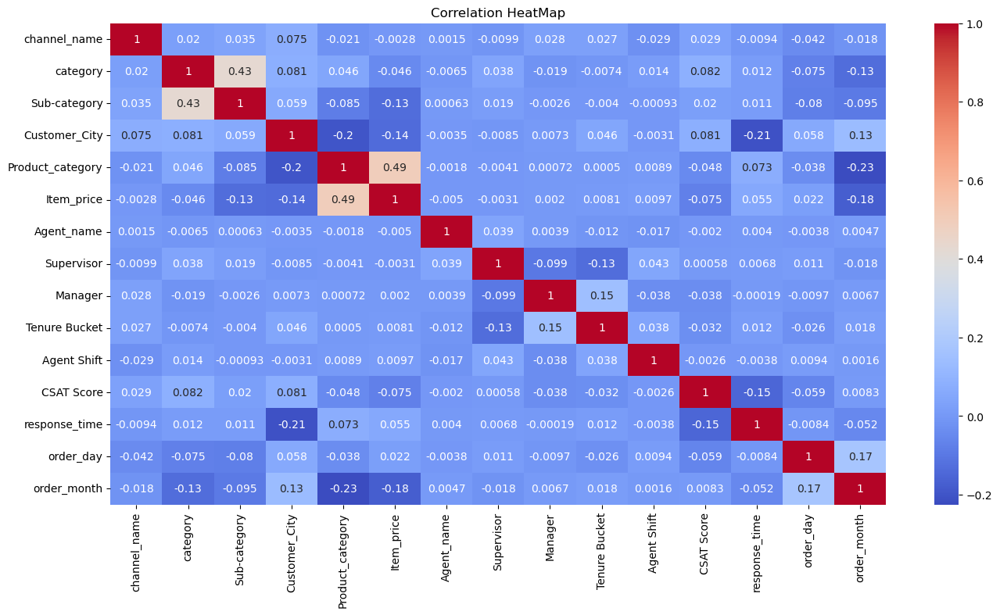

In [80]:
plt.figure(figsize=(16,8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation HeatMap")
plt.show()

##### 1. Why did you pick the specific chart?

**Correlation Heatmap** is used to understand relationships between different variables in a dataset. 

    * It provides clear visual representation of correlation coefficients\
    * Allows quick identification of patterns
    * Useful for feature selection

##### 2. What is/are the insight(s) found from the chart?

* **Strong Positive Correlation between "category" and "Sub-category" (0.43)**
* **Strong Positive Correlation between "Product_category" and "Item_price" (0.49)**
* **Positive Correlation between "Tenure Bucket" and "Manager" (0.15)**
* **"CSAT Score" Shows Weak Correlations**


#### Chart 19 - Pair Plot

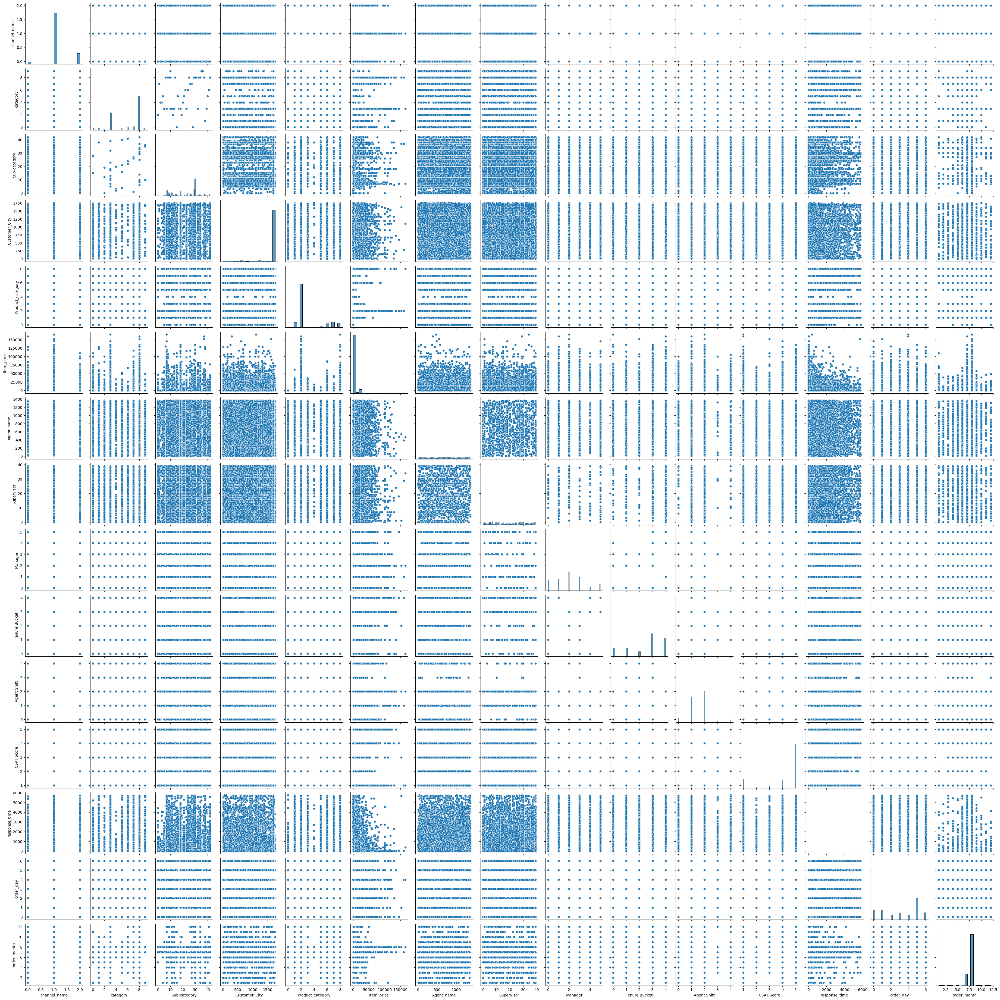

In [81]:
sns.pairplot(df)
plt.show()

##### 1. Why did you pick the specific chart?

* Exploring relationships between multiple numerical variables by displaying 
* scatter plots for each pair of variables.
* Identifying correlations and patterns across features.
* Detecting outliers by spotting unusual points in scatter plots.
* Observing distributions of individual variables along the diagonal.

## **5. Solution to Business Objective**

#### What do you suggest the client to achieve Business Objective ?
Explain Briefly.

Based on the EDA, I suggest the following

**1. Priortize and Optimize Response Times by Channel:**
    * Address extended response times for email interactions. Implement automated email routing systems to categorize inquiries and assign relevant support teams during peak hours.\

**2. Focus on High-Demand Time Periods:**
    * Ensure adequate staff on particularly in August and on Tuesdays to handle increased support requests.\

**3. Address Product-Category specific issues:**
    * For electronics, focus on improving product quality and accuracy to reduce returns and order-related issues.\
    * For lifestyle category, streamline refund and return process to minimize delays.\
    * For mobile issues, investigate and resolve online payment and payment-related queries.\

**4. Ensuring Agent Performances:**
    * Provide targeted training to underperforming agents to improve CSAT Scores and Rewards to Best performing agents to encourage others.\

**5. Leverage Location Data**
    * Focus marketing efforts in high-performing cities like Hyderabad, New Delhi and Pune to maximize customer engagement.
    * Explore market opportunities in underperforming cities by offering localized promotions and customer support.


# **Conclusion**

This EDA provided valuable insights into Flipkart's customer support operations, highlighting key drivers of customer satisfaction and areas for improvement.

* **Time-Related Patterns :** Order volumes showed peak times in specific months, days, and hours, suggesting opportunities for optimized resource allocation.

* **Category-Specific Issues :** The analysis revealed distinct problem areas within different product categories, enabling targeted interventions and process improvements.

* **Agent Performance :** Variations in agent performance, as measured by CSAT scores and response times, highlighted the need for personalized training and support. Tenure Impacted Agent performance.

* **Channel Efficiency :** Discrepancies in response times across different channels emphasized the need to optimize email support and leverage the efficiency of inbound and outcall methods.

By implementing the proposed solutions—prioritizing response times, addressing category-specific issues, enhancing agent performance, and leveraging location-based strategies—Flipkart can enhance customer satisfaction, optimize support operations, and drive business growth. This proactive approach will not only resolve immediate customer concerns but also foster long-term customer loyalty and improve Flipkart's brand reputation.

### ***Hurrah! You have successfully completed your EDA Capstone Project !!!***